In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

## Task 1(a) Double Exposure

Number of images:  16
Original Image Size:  (4032, 3024, 3)
Resized Image Size:  (1024, 1024, 3)


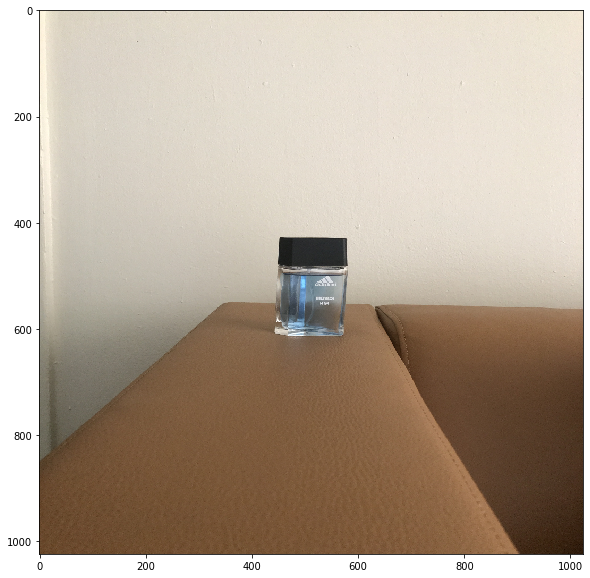

In [2]:
# Load all images
imgs_task1a = [cv2.imread(os.path.join('Images_task1a', img)) for img in sorted(os.listdir('Images_task1a')) if img.endswith('.jpg')]
print("Number of images: ", len(imgs_task1a))
print("Original Image Size: ", imgs_task1a[0].shape)

n_of_imgs = len(imgs_task1a)

# resize images to 1024x1024

imgs_task1a = [cv2.resize(img, (1024, 1024)) for img in imgs_task1a]
print("Resized Image Size: ", imgs_task1a[0].shape)

h = imgs_task1a[0].shape[0]
w = imgs_task1a[0].shape[1]
c = imgs_task1a[0].shape[2]

# Restore original color of the images

imgs_task1a = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in imgs_task1a]

plt.figure(figsize=(10,10))
plt.imshow(imgs_task1a[2])
plt.show()

#### SNR without adding custom noise

In [3]:
# Calculate SNR of Individual Images
def calculate_snr(imgs):
    mean = np.array([np.mean(img) for img in imgs])
    std = np.array([np.std(img) for img in imgs])
    snrs = mean/std
    return snrs

# Calculate noise variance of images
def calculate_noise_variance(imgs):
    var = []
    diff_imgs = []
    d_img = 0
    for img in imgs:
        d_img = np.subtract(img, d_img, dtype=np.int)
        var.append(np.var(d_img))
        d_img = img
    return np.average(var), var

# Scale Image
def scale_img(img, qmin=0, qmax=255):
    max_val = img.max()
    min_val = img.min()
    scaled_img = ((img - min_val)/(max_val - min_val)) * (qmax - qmin)
    
    return scaled_img.astype(np.uint8)

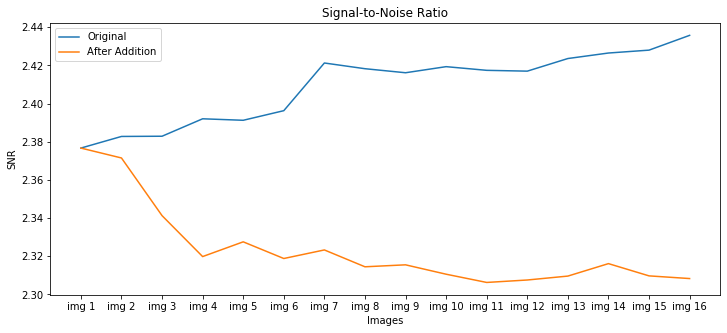

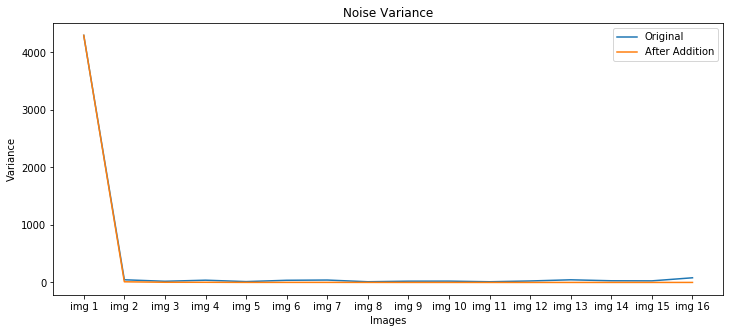

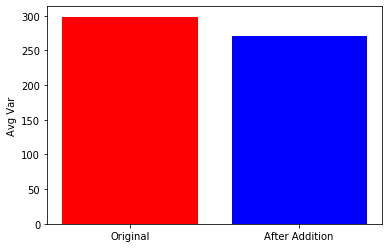

In [4]:
# Compute SNR of original images
original_snrs = calculate_snr(imgs_task1a)

xticks = ['img {}'.format(i + 1) for i in range(len(imgs_task1a))]

plt.figure(figsize=(12,5))

# Plot SNR of original images
plt.title('Signal-to-Noise Ratio')
plt.plot(original_snrs, label='Original')
plt.xlabel("Images")
plt.ylabel('SNR')
plt.xticks(ticks=list(range(len(imgs_task1a))), labels=xticks)


de_img = 0  # Final image after addition
new_imgs = [] # Store all images during iterative additions
for i,img in enumerate(imgs_task1a):
    de_img = np.add(de_img, img, dtype=np.long)
    new_imgs.append(scale_img(de_img))

# Compute SNR of the new images acquired through the iterative addition process

snrs_after_addition = calculate_snr(new_imgs)

plt.plot(snrs_after_addition, label='After Addition')
plt.legend()

# Compute Noise Variances of original and added images
avg_noise_var_o, noise_vars_o = calculate_noise_variance(imgs_task1a)
avg_noise_var_n, noise_vars_n = calculate_noise_variance(new_imgs)

plt.figure(figsize=(12,5))

# Plot Noise Variances of original and add images
plt.title('Noise Variance')
plt.plot(noise_vars_o, label='Original')
plt.xlabel("Images")
plt.ylabel('Variance')
plt.xticks(ticks=list(range(len(imgs_task1a))), labels=xticks)

plt.plot(noise_vars_n, label='After Addition')
plt.legend()

plt.figure()
labels = ['Original', 'After Addition']
plt.bar(labels, [avg_noise_var_o, avg_noise_var_n], color=['r', 'b'])
plt.ylabel('Avg Var')
plt.show()

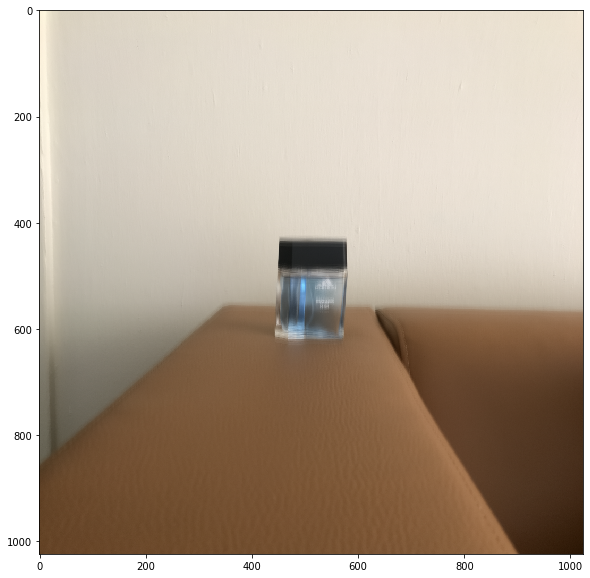

In [5]:
plt.figure(figsize=(10,10))
plt.imshow(scale_img(de_img))

#### SNR with custom noise

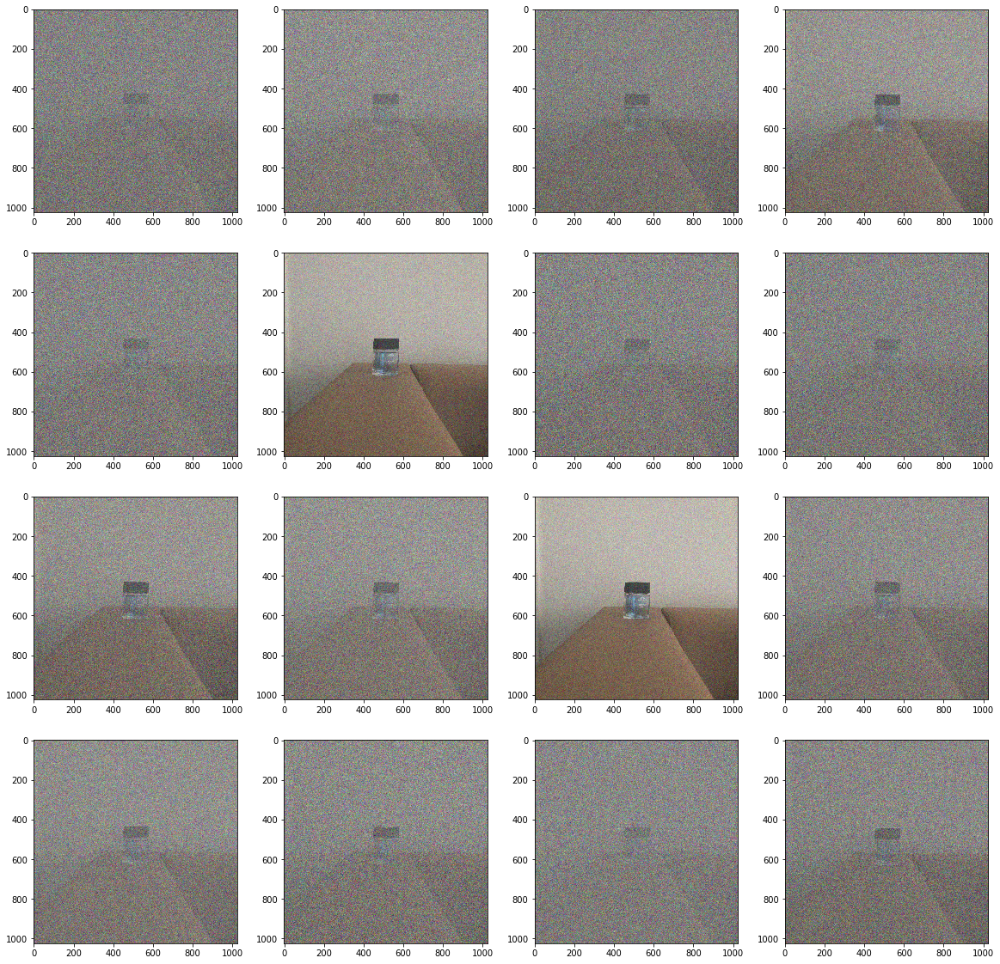

In [6]:
noise_means = np.random.rand(len(imgs_task1a))
noise_std = np.random.rand(len(imgs_task1a))

noisy_imgs = []

for mean, std, img in zip(noise_means, noise_std, imgs_task1a):
    noise = np.random.normal(mean, std, size=(h, w, c)) * 255
    n_img = np.add(img, noise, dtype=np.float32)
    noisy_imgs.append(scale_img(n_img))

fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(20,20))

for img, ax in zip(noisy_imgs, axs.flatten()):
    ax.imshow(img)

plt.show()

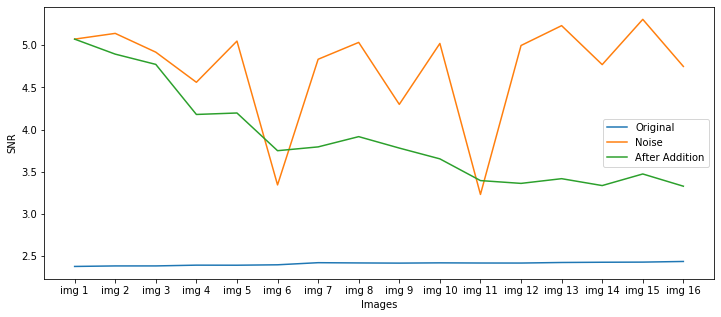

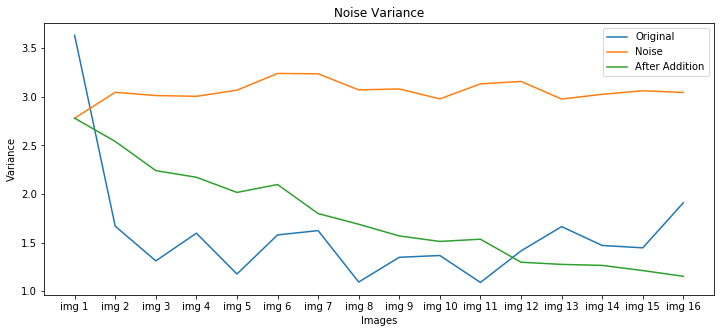

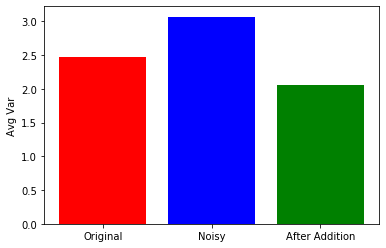

In [7]:
plt.figure(figsize=(12,5))

# Plot SNR of original images
plt.plot(original_snrs, label='Original')
plt.xlabel("Images")
plt.ylabel('SNR')
plt.xticks(ticks=list(range(len(imgs_task1a))), labels=xticks)

snrs_after_noise = calculate_snr(noisy_imgs)

plt.plot(snrs_after_noise, label='Noise')

de_img = 0  # Final image after addition
new_imgs = [] # Store all images during iterative additions
for i,img in enumerate(noisy_imgs):
    de_img = np.add(de_img, img, dtype=np.float64)
    new_imgs.append(scale_img(de_img))

# Compute SNR of the new images acquired through the iterative addition process

snrs_after_addition = calculate_snr(new_imgs)

plt.plot(snrs_after_addition, label='After Addition')
plt.legend()

# Compute Noise Variances of original and added images
avg_noise_var_o, noise_vars_o = calculate_noise_variance(imgs_task1a)
avg_noise_var_noisy, noise_vars_noisy = calculate_noise_variance(noisy_imgs)
avg_noise_var_new, noise_vars_new = calculate_noise_variance(new_imgs)

plt.figure(figsize=(12,5))

# Plot Noise Variances of original and add images
plt.title('Noise Variance')
plt.plot(np.log10(noise_vars_o), label='Original')
plt.xlabel("Images")
plt.ylabel('Variance')
plt.xticks(ticks=list(range(len(imgs_task1a))), labels=xticks)

plt.plot(np.log10(noise_vars_noisy), label='Noise')

plt.plot(np.log10(noise_vars_new), label='After Addition')
plt.legend()

plt.figure()
labels = ['Original', 'Noisy', 'After Addition']
plt.bar(labels, np.log10([avg_noise_var_o,  avg_noise_var_noisy, avg_noise_var_new]), color=['r', 'b', 'g'])
plt.ylabel('Avg Var')
plt.show()

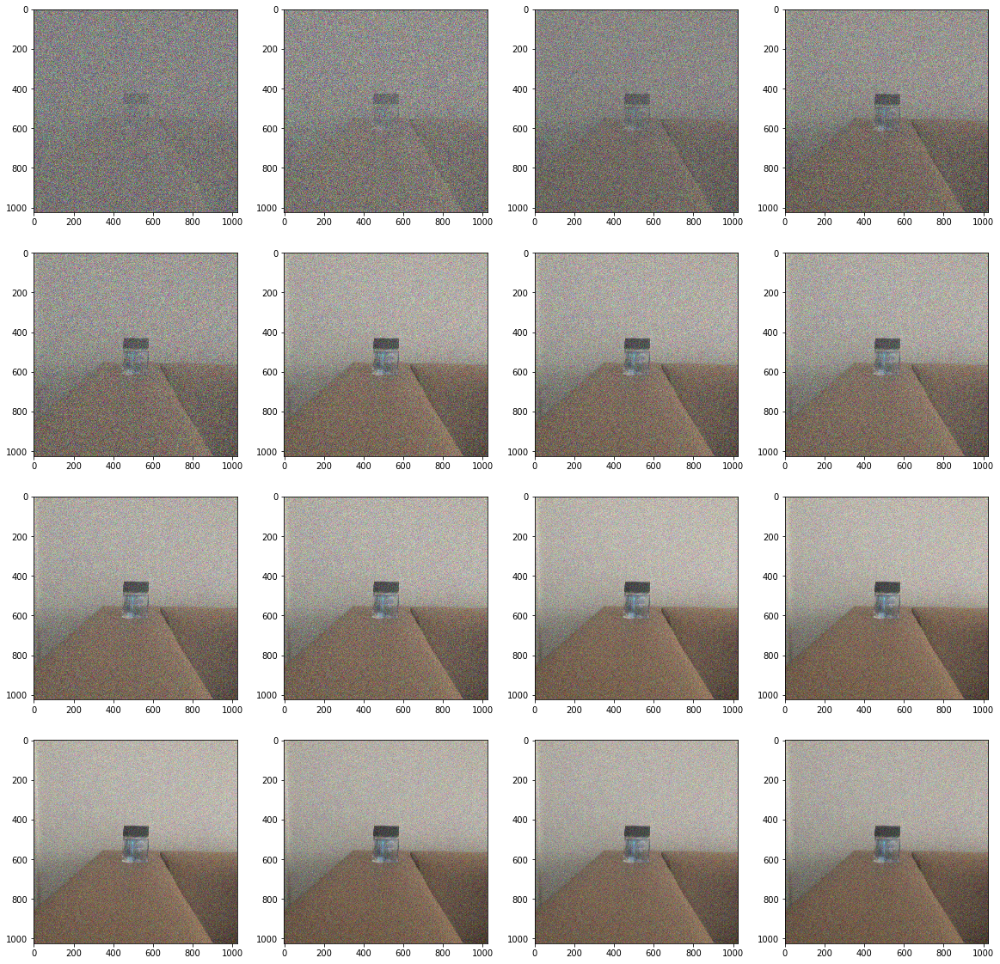

In [8]:
# Plot images after additions
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(20,20))

for img, ax in zip(new_imgs, axs.flatten()):
    ax.imshow(scale_img(img))

plt.show()

## Task (1b) Change Detection

#### Change Detection in original images

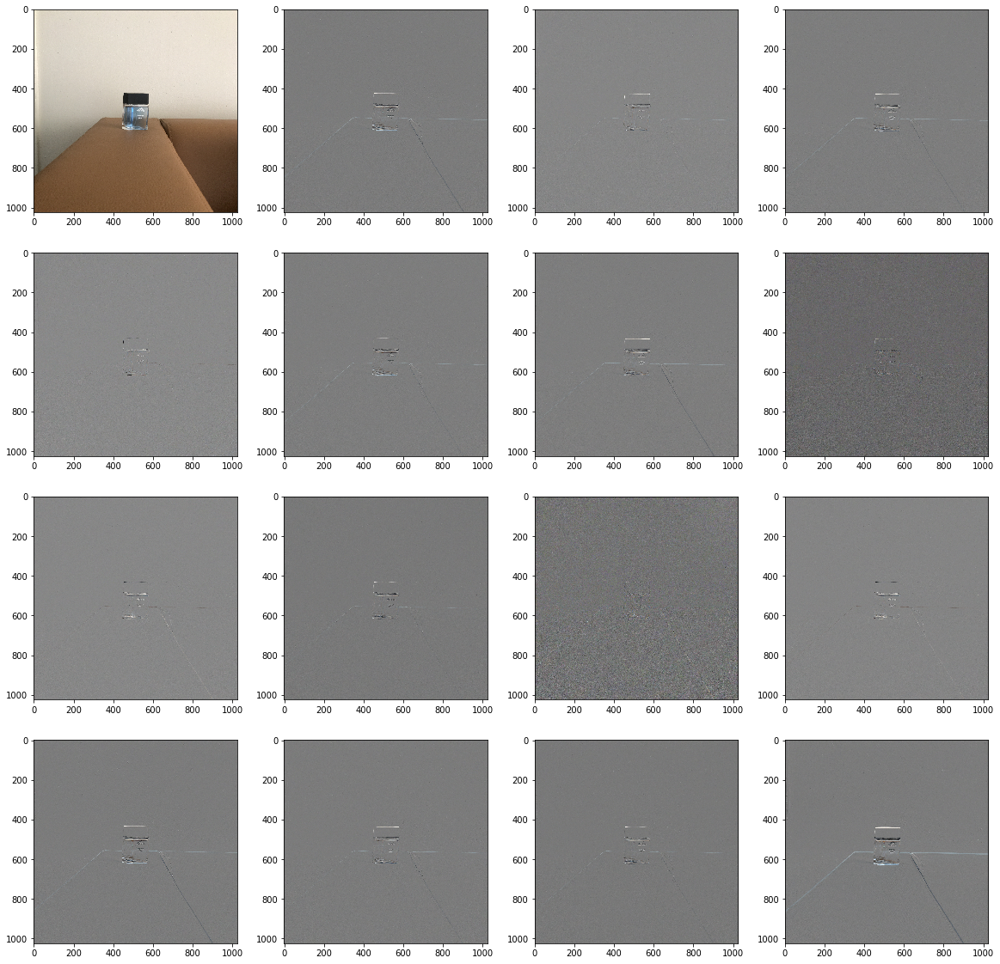

In [9]:
# Compute differences in consecutive images
diff_imgs = []
d_img = 0
for img in imgs_task1a:
    d_img = np.subtract(img, d_img, dtype=np.int)
    diff_imgs.append(d_img)
    d_img = img
    
# Plot to observe detection

fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(20,20))

for img, ax in zip(diff_imgs, axs.flatten()):
    ax.imshow(scale_img(img), cmap=cm.binary)

plt.show()

#### Change Detection in noisy images

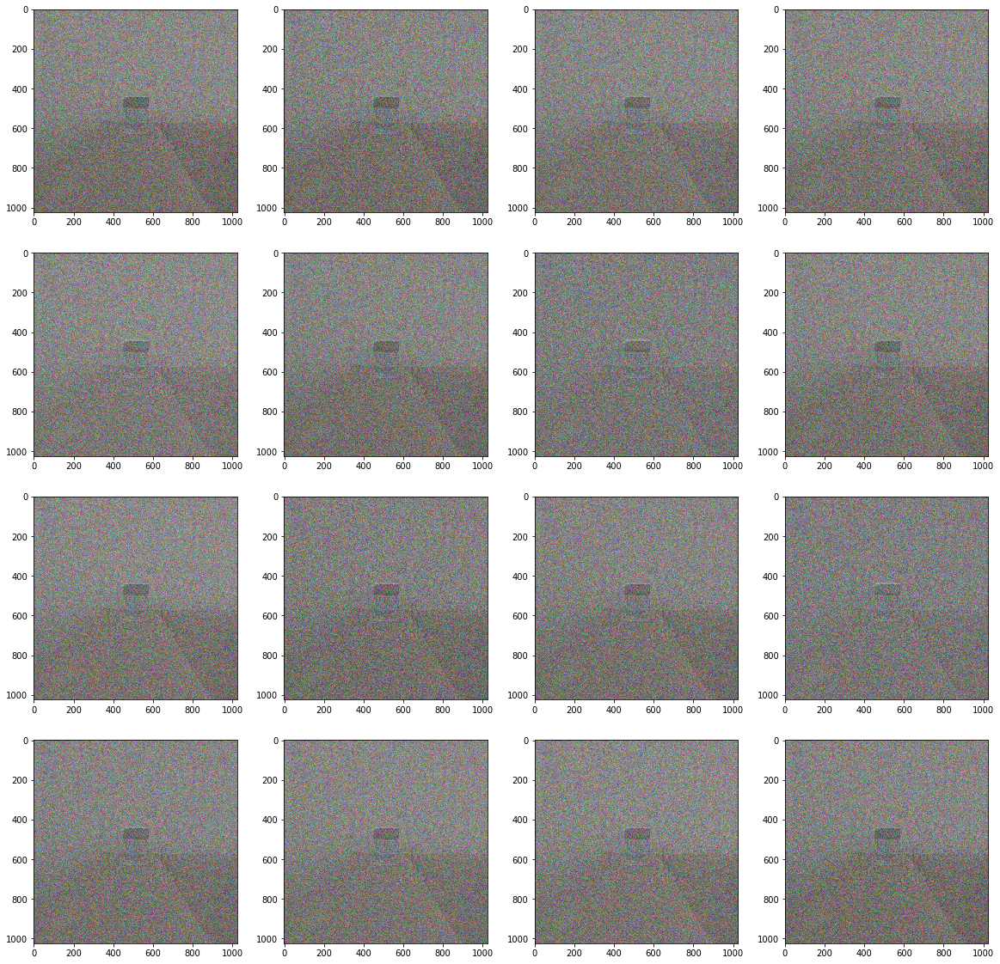

In [10]:
# Compute differences in consecutive noisy images
diff_imgs = []
d_img = 0
for img in noisy_imgs:
    d_img = np.subtract(n_img, d_img)
    diff_imgs.append(scale_img(d_img))
    d_img = img
    
# Plot to observe detection

fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(20,20))

for img, ax in zip(diff_imgs, axs.flatten()):
    ax.imshow(scale_img(img), cmap=cm.binary_r)

plt.show()

## Task (1c) Multiplication of Images (Applying Masks)

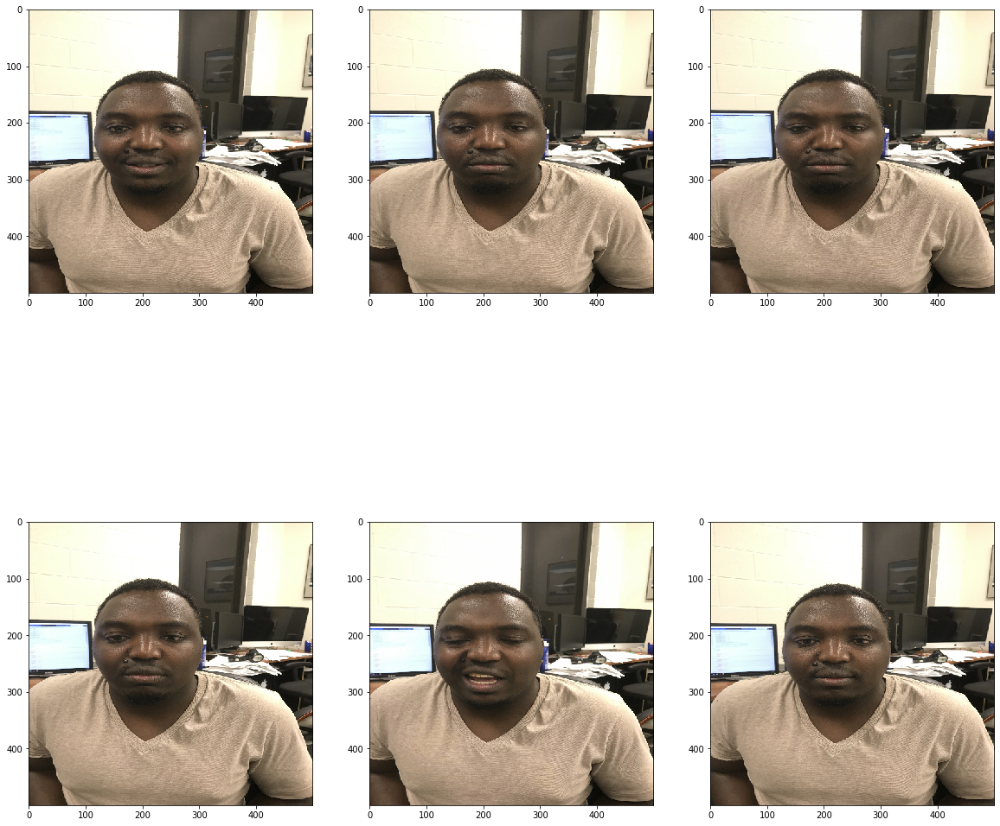

In [11]:
import matplotlib.patches as patches
paths = [os.path.join('Images_task1c', path) for path in os.listdir('Images_task1c') if path.endswith('.jpg')]

imgs_task1c = []
for img_path in paths:
    img = cv2.imread(img_path)
    img = cv2.resize(img, (500,500))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imgs_task1c.append(img)

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(20,20))


for ax,img in zip(axes.flatten(), imgs_task1c):
    ax.imshow(img)
    
plt.show()

#### Masks

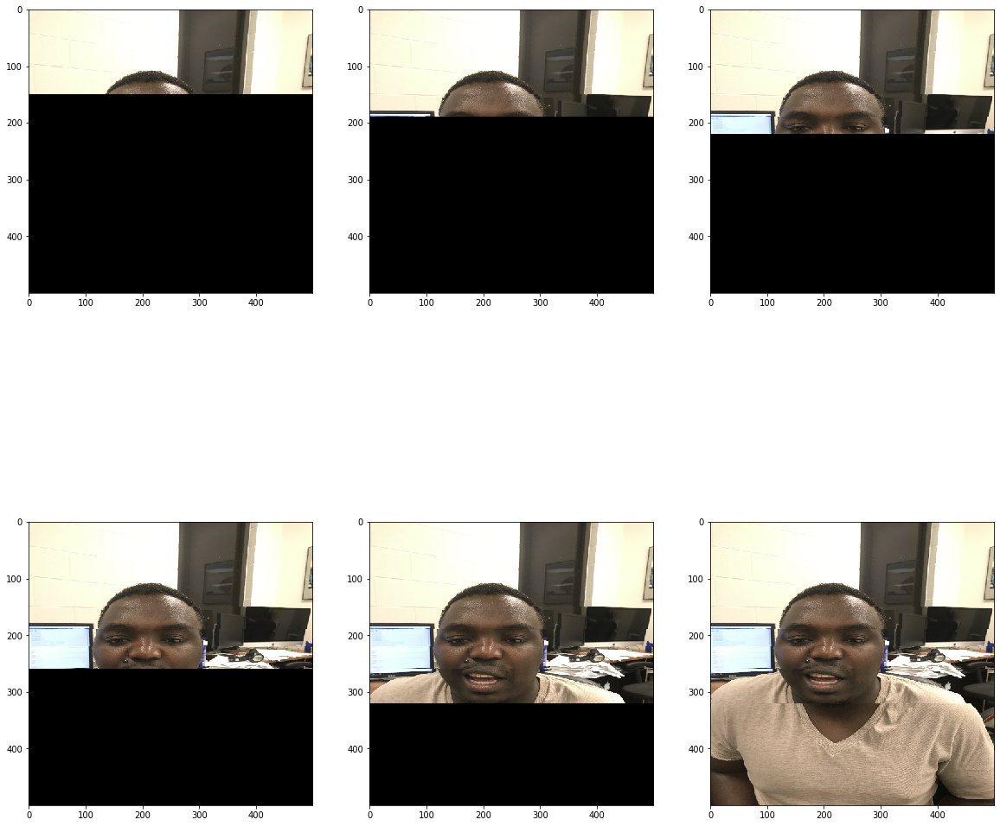

In [12]:
head = np.zeros((500, 500, 3), dtype=np.uint8)
head[0:150, :, :] = 255

forehead = np.zeros((500, 500, 3), dtype=np.uint8)
forehead[150:190, :, :] = 255

eyes = np.zeros((500, 500, 3), dtype=np.uint8)
eyes[190:220, :, :] = 255

nose = np.zeros((500, 500, 3), dtype=np.uint8)
nose[220:260, :, :] = 255

mouth = np.zeros((500, 500, 3), dtype=np.uint8)
mouth[260:320, :, :] = 255

rest = np.zeros((500, 500, 3), dtype=np.uint8)
rest[320:500, :, :] = 255

masks = [head, forehead, eyes, nose, mouth, rest]

masked_imgs = []
for mask,img in zip(masks, imgs_task1c):
    m_img = np.multiply(img, mask, dtype=np.int)
    masked_imgs.append(scale_img(m_img))

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(20, 20))

added_imgs = []
a_img = 0
for img, ax in zip(masked_imgs, axes.flatten()):
    a_img = np.add(img, a_img, dtype=np.int)
    ax.imshow(a_img)
plt.show()

## Task 2(a) Image Resolution

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32]

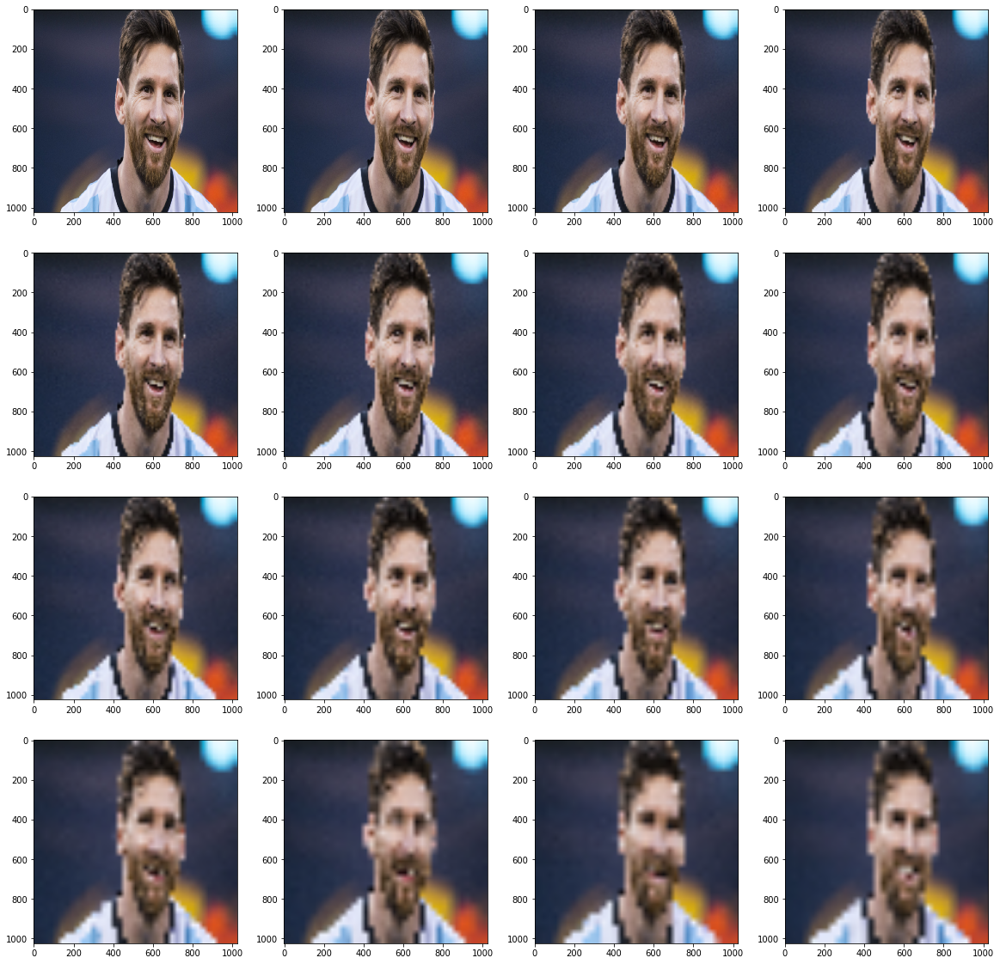

In [13]:
from math import ceil
img_task2a = cv2.imread('Images_task1c/imgs/messi-hair.jpg')
img_task2a = cv2.cvtColor(img_task2a, cv2.COLOR_BGR2RGB)
img_task2a = cv2.resize(img_task2a, (1024,1024))
# f = np.ones((2,2))
# img = []
# for i in range(0,1024,2):
#     for j in range(0, 1024, 2):
#         img.append(np.average(img_task2a[i:i+2, i:i+2]))
        
# img = np.reshape(img, (512,512))

factors = list(range(2, 34, 2))

h, w, c = img_task2a.shape

images = []
for factor in factors:
    n_h = int(h/factor)
    n_w = int(h/factor)
    img = cv2.resize(img_task2a, (n_h, n_w))
    img = cv2.resize(img, (h, w))
    images.append(img)
    
fig, axes = plt.subplots(nrows=int(len(factors)/4), ncols=int(len(factors)/4), figsize=(20,20))

for img, ax in zip(images, axes.flatten()):
    ax.imshow(img, cmap=cm.gray)
factors

## Task 2(b) Quantization

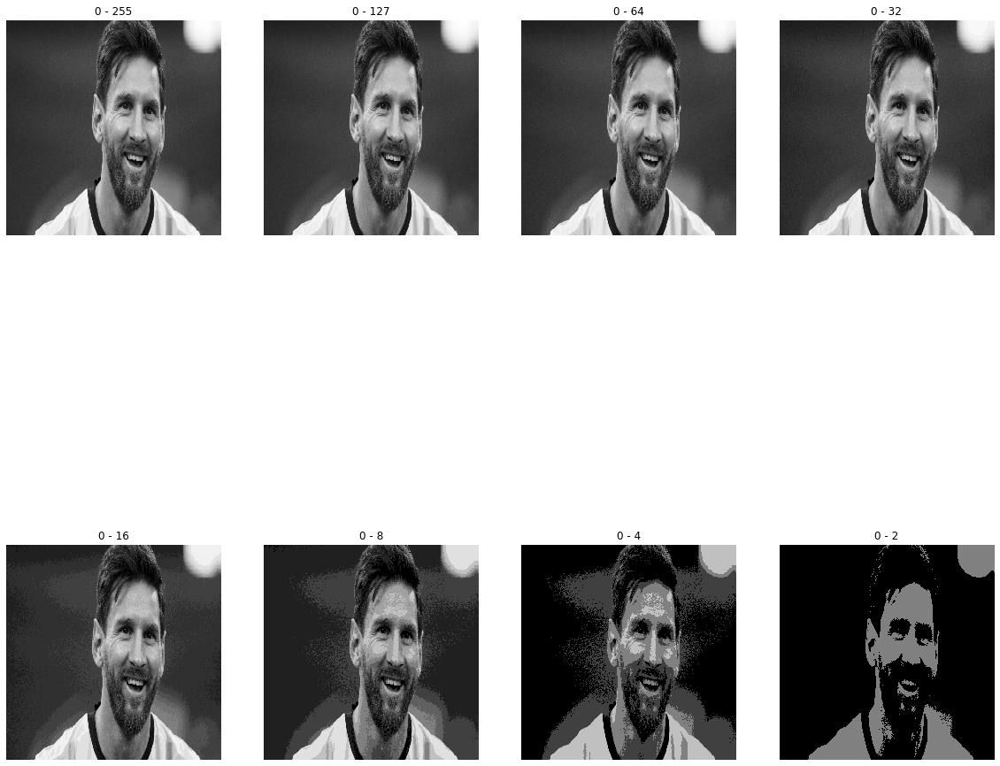

In [14]:
quant_values = [255, 127, 64, 32, 16, 8, 4, 2]
images = []
img_task2a_gray = cv2.cvtColor(img_task2a, cv2.COLOR_BGR2GRAY)
for val in quant_values:
    img = scale_img(img_task2a_gray, qmax=val)
    images.append(img)
    
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20,20))

for img, ax, qmax in zip(images, axes.flatten(), quant_values):
    ax.imshow(img, cmap=cm.gray)
    ax.set_title('0 - {}'.format(qmax))
    ax.axis('off')

## Task 2(c) Multi-Resolution

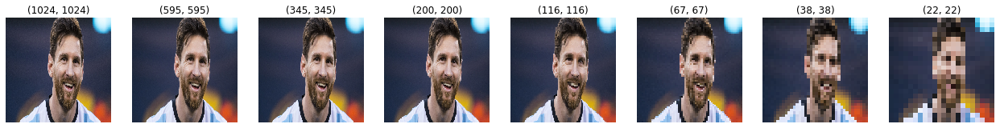

In [16]:
images = [img_task2a]
n_h = h
n_w = w
res = [(1024, 1024)]
while n_h > 22:
    n_h = int(n_h/1.72)
    n_w = int(n_w/1.72)
    img = cv2.resize(img_task2a, (n_h, n_w))
    images.append(img)
    res.append((n_h, n_w))

fig, axes = plt.subplots(ncols=8)

for img, ax, r in zip(images, axes, res):
    ax.set_title(r)
    ax.imshow(img)
    ax.figure.set_size_inches(r[0], r[1])
    ax.autoscale()
    ax.axis('off')
